# G2M Insight for Cab Investment Firm

## Imports

In [1]:
import warnings
import numpy as np
import pandas as pd
import plotly.express as px
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.figure_factory as ff
import datetime as dt
import altair as alt

warnings.filterwarnings("ignore")

## Read Data

In [2]:
# read in data into dataframes
df_cab = pd.read_csv('Cab_Data.csv')
df_city = pd.read_csv('City.csv')
df_customer = pd.read_csv('Customer_ID.csv')
df_transaction = pd.read_csv('Transaction_ID.csv')

## Clean Data

### Cab Data

In [3]:
# head of cab data
df_cab.head(5)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip
0,10000011,42377,Pink Cab,ATLANTA GA,30.45,370.95,313.635
1,10000012,42375,Pink Cab,ATLANTA GA,28.62,358.52,334.854
2,10000013,42371,Pink Cab,ATLANTA GA,9.04,125.20,97.632
3,10000014,42376,Pink Cab,ATLANTA GA,33.17,377.40,351.602
4,10000015,42372,Pink Cab,ATLANTA GA,8.73,114.62,97.776


In [4]:
# get info on cab data
df_cab.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359392 entries, 0 to 359391
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Transaction ID  359392 non-null  int64  
 1   Date of Travel  359392 non-null  int64  
 2   Company         359392 non-null  object 
 3   City            359392 non-null  object 
 4   KM Travelled    359392 non-null  float64
 5   Price Charged   359392 non-null  float64
 6   Cost of Trip    359392 non-null  float64
dtypes: float64(3), int64(2), object(2)
memory usage: 19.2+ MB


In [5]:
# get shape of cab data
df_cab.shape

(359392, 7)

The shape of the data matches the number of non-null values in each of the seven columns, meaning no NAN values in the cab data.

In [6]:
# change company and city to categorical data
df_cab['Company'] = df_cab['Company'].astype('category')
df_cab['City'] = df_cab['City'].astype('category')

# get info on cab data
df_cab.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359392 entries, 0 to 359391
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype   
---  ------          --------------   -----   
 0   Transaction ID  359392 non-null  int64   
 1   Date of Travel  359392 non-null  int64   
 2   Company         359392 non-null  category
 3   City            359392 non-null  category
 4   KM Travelled    359392 non-null  float64 
 5   Price Charged   359392 non-null  float64 
 6   Cost of Trip    359392 non-null  float64 
dtypes: category(2), float64(3), int64(2)
memory usage: 14.4 MB


In [7]:
# function to change date from ordinal to datetime
def convert_date(date):
    # get ordinal date
    date_ordinal = dt.date(1900, 1, 30).toordinal() + date - 2

    # convert to greogrian date
    convert = dt.date.fromordinal(date_ordinal).strftime("%m/%d/%Y")

    # return converted date
    return convert

# change data of travel to datetime
df_cab['Date of Travel'] = df_cab['Date of Travel'].apply(convert_date)

# get info on cab data
df_cab.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359392 entries, 0 to 359391
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype   
---  ------          --------------   -----   
 0   Transaction ID  359392 non-null  int64   
 1   Date of Travel  359392 non-null  object  
 2   Company         359392 non-null  category
 3   City            359392 non-null  category
 4   KM Travelled    359392 non-null  float64 
 5   Price Charged   359392 non-null  float64 
 6   Cost of Trip    359392 non-null  float64 
dtypes: category(2), float64(3), int64(1), object(1)
memory usage: 14.4+ MB


We changed the types of 'Company' and 'City' to categorica, and changed the ordinal format of the 'Date of Travel' to a Gregorian format.

In [8]:
# head of cab data
df_cab.head(5)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip
0,10000011,02/06/2016,Pink Cab,ATLANTA GA,30.45,370.95,313.635
1,10000012,02/04/2016,Pink Cab,ATLANTA GA,28.62,358.52,334.854
2,10000013,01/31/2016,Pink Cab,ATLANTA GA,9.04,125.20,97.632
3,10000014,02/05/2016,Pink Cab,ATLANTA GA,33.17,377.40,351.602
4,10000015,02/01/2016,Pink Cab,ATLANTA GA,8.73,114.62,97.776


Cleaning the cab data is complete.

### City Data

In [9]:
# city data
df_city

,City,Population,Users
0,NEW YORK NY,"8,405,837","302,149"
1,CHICAGO IL,"1,955,130","164,468"
2,LOS ANGELES CA,"1,595,037","144,132"
3,MIAMI FL,"1,339,155","17,675"
4,SILICON VALLEY,"1,177,609","27,247"
5,ORANGE COUNTY,"1,030,185","12,994"
6,SAN DIEGO CA,"959,307","69,995"
7,PHOENIX AZ,"943,999","6,133"
8,DALLAS TX,"942,908","22,157"
9,ATLANTA GA,"814,885","24,701"


In [10]:
# get info on city data
df_city.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   City        20 non-null     object
 1   Population  20 non-null     object
 2   Users       20 non-null     object
dtypes: object(3)
memory usage: 608.0+ bytes


In [11]:
# get shape of city data
df_city.shape

(20, 3)

The shape of the data matches the number of non-null values in each of the three columns, meaning no NAN values in the city data.

In [12]:
# convert city to categorical data
df_city['City'] = df_city['City'].astype('category')

# convert population and users from string to int
df_city['Population'] = df_city['Population'].str.replace(',', '').astype(int)
df_city['Users'] = df_city['Users'].str.replace(',', '').astype(int)

# get info on city data
df_city.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   City        20 non-null     category
 1   Population  20 non-null     int64   
 2   Users       20 non-null     int64   
dtypes: category(1), int64(2)
memory usage: 1.2 KB


We changed the types of 'City' to categorical, and changed the type of 'Population' and 'Users' to int.

In [13]:
# city data
df_city

,City,Population,Users
0,NEW YORK NY,8405837,302149
1,CHICAGO IL,1955130,164468
2,LOS ANGELES CA,1595037,144132
3,MIAMI FL,1339155,17675
4,SILICON VALLEY,1177609,27247
5,ORANGE COUNTY,1030185,12994
6,SAN DIEGO CA,959307,69995
7,PHOENIX AZ,943999,6133
8,DALLAS TX,942908,22157
9,ATLANTA GA,814885,24701


Cleaning the city data is complete.

### Customer Data

In [14]:
# head of customer data
df_customer.head(5)

,Customer ID,Gender,Age,Income (USD/Month)
0,29290,Male,28,10813
1,27703,Male,27,9237
2,28712,Male,53,11242
3,28020,Male,23,23327
4,27182,Male,33,8536


In [15]:
# get info on customer data
df_customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49171 entries, 0 to 49170
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Customer ID         49171 non-null  int64 
 1   Gender              49171 non-null  object
 2   Age                 49171 non-null  int64 
 3   Income (USD/Month)  49171 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 1.5+ MB


In [16]:
# get shape of customer data
df_customer.shape

(49171, 4)

The shape of the customer data matches the number of non-null values in the three columns of the customer data, so we aren't missing any data.

In [17]:
# convert gender to categorical data
df_customer['Gender'] = df_customer['Gender'].astype('category')

# get info on customer data
df_customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49171 entries, 0 to 49170
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   Customer ID         49171 non-null  int64   
 1   Gender              49171 non-null  category
 2   Age                 49171 non-null  int64   
 3   Income (USD/Month)  49171 non-null  int64   
dtypes: category(1), int64(3)
memory usage: 1.2 MB


In [18]:
# head of customer data
df_customer.head(5)

,Customer ID,Gender,Age,Income (USD/Month)
0,29290,Male,28,10813
1,27703,Male,27,9237
2,28712,Male,53,11242
3,28020,Male,23,23327
4,27182,Male,33,8536


Cleaning the customer data is complete.

### Transaction Data

In [19]:
# head of transaction data
df_transaction.head(5)

,Transaction ID,Customer ID,Payment_Mode
0,10000011,29290,Card
1,10000012,27703,Card
2,10000013,28712,Cash
3,10000014,28020,Cash
4,10000015,27182,Card


In [20]:
# get info on transaction data
df_transaction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440098 entries, 0 to 440097
Data columns (total 3 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   Transaction ID  440098 non-null  int64 
 1   Customer ID     440098 non-null  int64 
 2   Payment_Mode    440098 non-null  object
dtypes: int64(2), object(1)
memory usage: 10.1+ MB


In [21]:
# get shape of transaction data
df_transaction.shape


(440098, 3)

The shape of the transaction data matches the number of non-null values in the three columns of the customer data, so we aren't missing any data.

In [22]:
# convert payment method to categorical data
df_transaction['Payment_Mode'] = df_transaction['Payment_Mode'].astype('category')

# get info on transaction data
df_transaction.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440098 entries, 0 to 440097
Data columns (total 3 columns):
 #   Column          Non-Null Count   Dtype   
---  ------          --------------   -----   
 0   Transaction ID  440098 non-null  int64   
 1   Customer ID     440098 non-null  int64   
 2   Payment_Mode    440098 non-null  category
dtypes: category(1), int64(2)
memory usage: 7.1 MB


Cleaning the transaction data is complete.

## Master Data Creation and EDA

In [23]:
# merge all dataframes
df = df_cab.merge(df_city, on = 'City').merge(df_transaction, on= 'Transaction ID').merge(df_customer, on ='Customer ID')


In [24]:
# head of merged data
df.head(5)


,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Population,Users,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month)
0,10000011,02/06/2016,Pink Cab,ATLANTA GA,30.45,370.95,313.6350,814885,24701,29290,Card,Male,28,10813
1,10351127,08/19/2018,Yellow Cab,ATLANTA GA,26.19,598.70,317.4228,814885,24701,29290,Cash,Male,28,10813
2,10412921,12/22/2018,Yellow Cab,ATLANTA GA,42.55,792.05,597.4020,814885,24701,29290,Card,Male,28,10813
3,10000012,02/04/2016,Pink Cab,ATLANTA GA,28.62,358.52,334.8540,814885,24701,27703,Card,Male,27,9237
4,10320494,05/20/2018,Yellow Cab,ATLANTA GA,36.38,721.10,467.1192,814885,24701,27703,Card,Male,27,9237


In [25]:
# create profit column
df['Profit'] = df['Price Charged'] - df['Cost of Trip']


We can create a profit column, which should prove useful for further analysis.

In [26]:
# number of nan values in each column
df.isna().sum()


Transaction ID        0
Date of Travel        0
Company               0
City                  0
KM Travelled          0
Price Charged         0
Cost of Trip          0
Population            0
Users                 0
Customer ID           0
Payment_Mode          0
Gender                0
Age                   0
Income (USD/Month)    0
Profit                0
dtype: int64

We have no missing values in the data, so we are good to proceed with further analysis without having to manipulate the data further.

In [27]:
# describe data
df.describe()


,Transaction ID,KM Travelled,Price Charged,Cost of Trip,Population,Users,Customer ID,Age,Income (USD/Month),Profit
count,3.593920e+05,359392.000000,359392.000000,359392.000000,3.593920e+05,359392.000000,359392.000000,359392.000000,359392.000000,359392.000000
mean,1.022076e+07,22.567254,423.443311,286.190113,3.132198e+06,158365.582267,19191.652115,35.336705,15048.822937,137.253198
std,1.268058e+05,12.233526,274.378911,157.993661,3.315194e+06,100850.051020,21012.412463,12.594234,7969.409482,160.311840
min,1.000001e+07,1.900000,15.600000,19.000000,2.489680e+05,3643.000000,1.000000,18.000000,2000.000000,-220.060000
25%,1.011081e+07,12.000000,206.437500,151.200000,6.712380e+05,80021.000000,2705.000000,25.000000,8424.000000,28.012000
50%,1.022104e+07,22.440000,386.360000,282.480000,1.595037e+06,144132.000000,7459.000000,33.000000,14685.000000,81.962000
75%,1.033094e+07,32.960000,583.660000,413.683200,8.405837e+06,302149.000000,36078.000000,42.000000,21035.000000,190.030000
max,1.044011e+07,48.000000,2048.030000,691.200000,8.405837e+06,302149.000000,60000.000000,65.000000,35000.000000,1463.966000


We have some basic stats on each column in the dataframe.

In [28]:
# correlation matrix between all columns
corr = df.corr()

# lists to plot
x = list(corr.columns)
y = list(corr.index)
z = np.array(corr)

# plotly correlation matrix
fig = ff.create_annotated_heatmap(
    z,
    x = x,
    y = y ,
    annotation_text = np.around(z, decimals=2),
    hoverinfo='z',
    colorscale='RdYlGn',
    showscale=True,
    )

# plot correlation matrix
fig.show()


The heatmap shows that `KM Travelled` has a strong positive correlation to `Cost of Trip` and `Price Charged`. There is no correlation between `Age` or `Income` to any of the other variables. We can see `Profit` also having a strong positive relationship to `Price Charged`. There is a strong correlation between `Population` and `Users`, which makes sense.

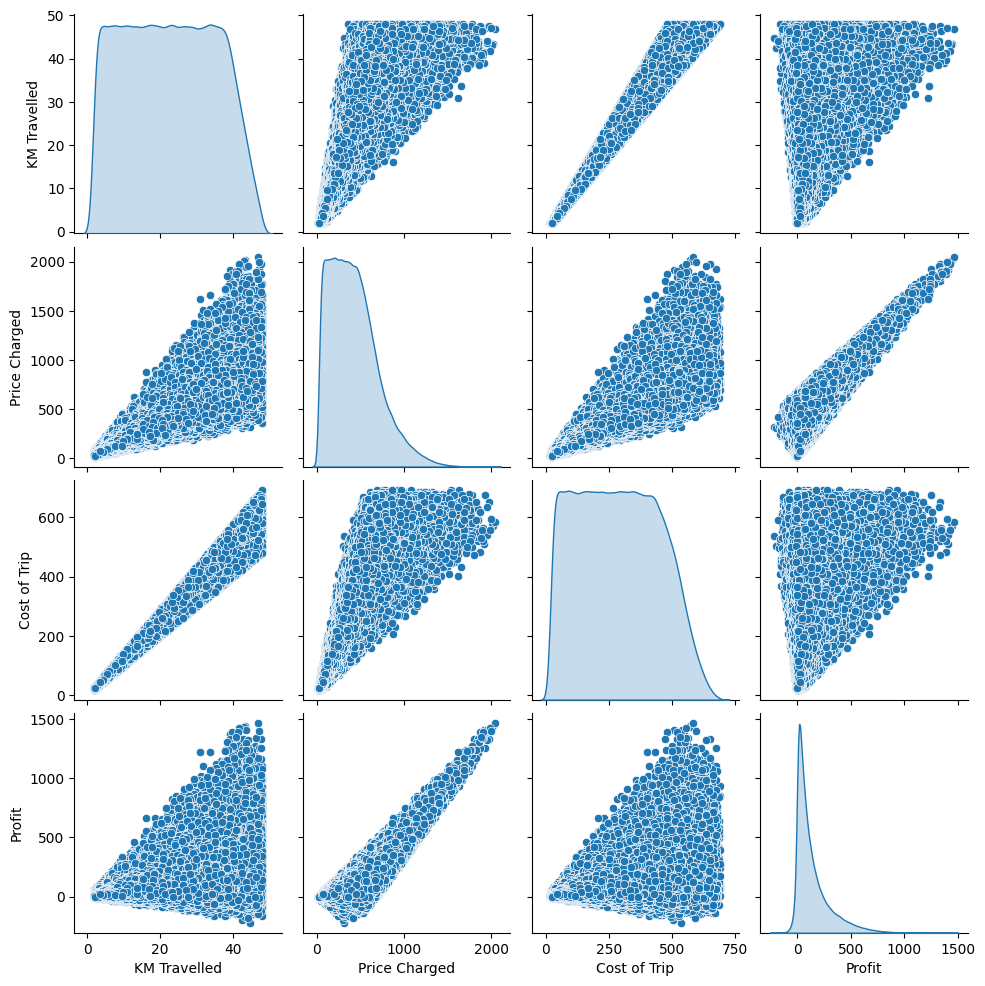

In [29]:
# pairplot of KM Travelled, Price Charged, Cost of Trip, Profit using seaborn
sns.pairplot(df[['KM Travelled', 'Price Charged', 'Cost of Trip', 'Profit']], diag_kind='kde')

# show plot
plt.show()


In [30]:
# plotly pie chart of value counts for company
fig = px.pie(df, values = df['Company'].value_counts(), names = df['Company'].value_counts().index, title = 'Company')
fig.show()


## Hypotheses and Analyses

### 1. Is there a difference in profit between companie and gender?

In [31]:
# plotly box plot of profit by company hue by gender
fig = px.box(df, x = 'Company', y = 'Profit', color = 'Gender', title = 'Profit by Company and Gender')

# show plot
fig.show()


The box plot above shows a difference in profit between pink and yellow cab, but no difference between gender.

### 2. How does profit over time compare between companies?

In [63]:
# year column from date of travel
df['Year'] = pd.DatetimeIndex(df['Date of Travel']).year

# average profit per year by company
avg = df.groupby(['Company', 'Year'])['Profit'].mean()

# line chart of avg profit per year by company
fig = px.line(avg, x = avg.index.get_level_values(1), y = avg.values, color = avg.index.get_level_values(0), title = 'Average Profit per Year by Company')

# change x axis to year
fig.update_xaxes(dtick = 1)

# add labels
fig.update_layout(xaxis_title = 'Year', yaxis_title = 'Average Profit')

# show plot
fig.show()

The line chart demonstrates a similar pattern of profit over the years between the cab companies, but Pink Cab seems to have an increase in profit for 2019 while Yellow Cab will decrease. We don't have the full data for 2019 but the current data can suggest a pattern for future years.

### 3. Is there a pattern in travel frequency throughout the year? & 4. Is there a pattern in profit throughout the year?

In [96]:
# month column from date of travel
df['Month'] = pd.DatetimeIndex(df['Date of Travel']).month

# number of trips per month by company
trips = df.groupby(['Company', 'Month'])['Transaction ID'].count()

# average profit per month by company
profit = df.groupby(['Company', 'Month'])['Profit'].mean()

# merge trips and profit
trips_profit = pd.merge(trips.reset_index(), profit.reset_index(), on = ['Company', 'Month'])

# brush for altair
brush = alt.selection(type='interval', resolve='global')

# line chart of trips per month by company with brush
trips = alt.Chart(trips_profit.reset_index()).mark_line(point=True).encode(
    x = alt.X('Month', title = 'Month'),
    color = alt.condition(brush, 'Company', alt.ColorValue('gray')),
    tooltip = ['Month', 'Transaction ID', 'Company']
).add_selection(
    brush
).properties(
    width = 500,
    height = 500,
    title = 'Number of Trips per Month by Company'
)

trips.encode(y = alt.Y('Transaction ID', title = 'Number of Trips')) | trips.encode(y = alt.Y('Profit', title = 'Average Profit'))

alt.HConcatChart(...)

The number of users is highest in January and December for both companies. Other than January, the number of users increases over time throughout the year. There seems to be no consistent pattern in profit throughout the year for either company. Both companies have different months for highest profit.

### 5. Is there a higher profit in certain cities?

In [101]:
# profit per city by company
profit = df.groupby(['Company', 'City'])['Profit'].mean()

# bar chart of profit per city by company
profit_chart = alt.Chart(profit.reset_index()).mark_bar().encode(
    x = alt.X('City', title = 'City'),
    y = alt.Y('Profit', title = 'Profit'),
    color = 'Company',
    tooltip = ['City', 'Profit', 'Company']
).properties(
    width = 500,
    height = 500,
    title = 'Profit per City by Company'
)

profit_chart

alt.Chart(...)

The market share of profit in all represented cities is majority Yellow Cab. These results are consistent with the higher profit and customer base we found previously.

Through the 5 research questions we investigated, Yellow Cab company stands out as a much better company to invest in, as they have a larger customer base, and a higher profit margin. Thye also have a much larger market share in all major cities represented. We suggest investment in Yellow Cab.